Train YOLOV11 object detection model on a custom dataset

In [ ]:
!nvidia-smi

Sun Dec  8 14:37:43 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   42C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

Install the ultralytics package

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.8/898.8 kB 34.5 MB/s eta 0:00:00


In [ ]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.47 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 32.6/112.6 GB disk)


Install YOLO V11 via Ultralytics

In [ ]:
from ultralytics import YOLO
from IPython.display import Image

Fine-tune YOLO11 on custom dataset

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="bH7IhAFEZ4P7fo7twX3h")
project = rf.workspace("brad-dwyer").project("aquarium-combined")
version = project.version(6)
dataset = version.download("yolov11")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.9/80.9 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.3 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Aquarium-Combined-6 in yolov11:: 100%|██████████| 1288/1288 [00:01<00:00, 1240.76it/s]


In [ ]:
dataset.location

'/content/Aquarium-Combined-6'

Custom Training

In [ ]:
!yolo task=detect mode=train data={dataset.location}/data.yaml model="yolo11n.pt" epochs=50 imgsz=640 patience=5

100% 5.35M/5.35M [00:00<00:00, 161MB/s]
Ultralytics 8.3.47 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/Aquarium-Combined-6/data.yaml, epochs=50, time=None, patience=5, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=F

### Examine training results

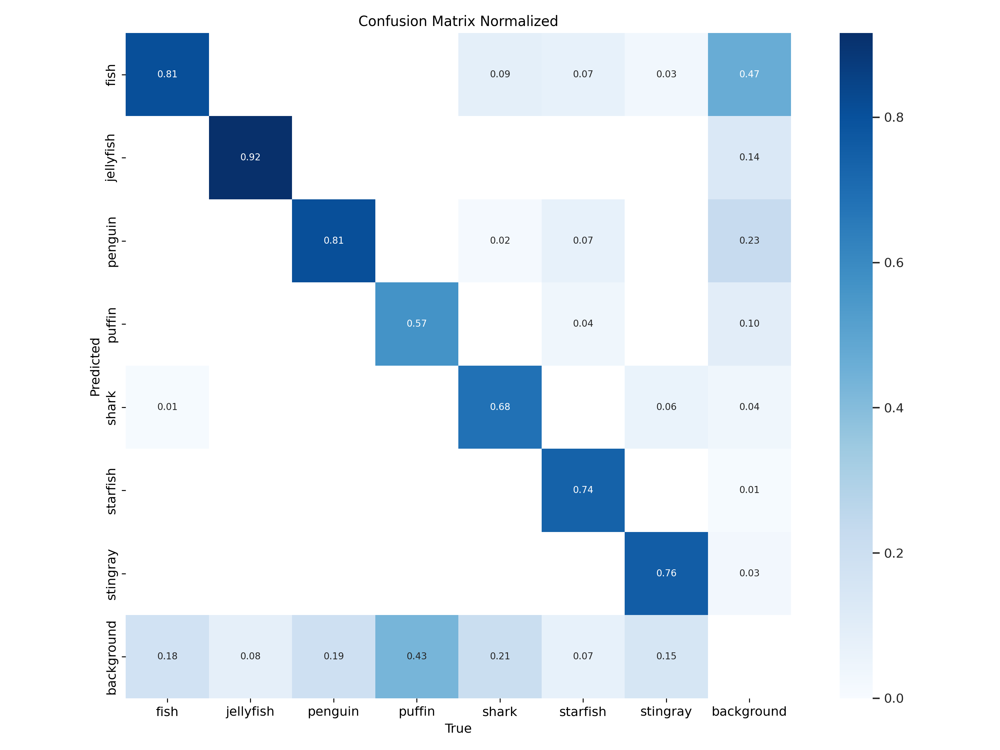

In [ ]:
Image("/content/runs/detect/train/confusion_matrix_normalized.png", width=600)

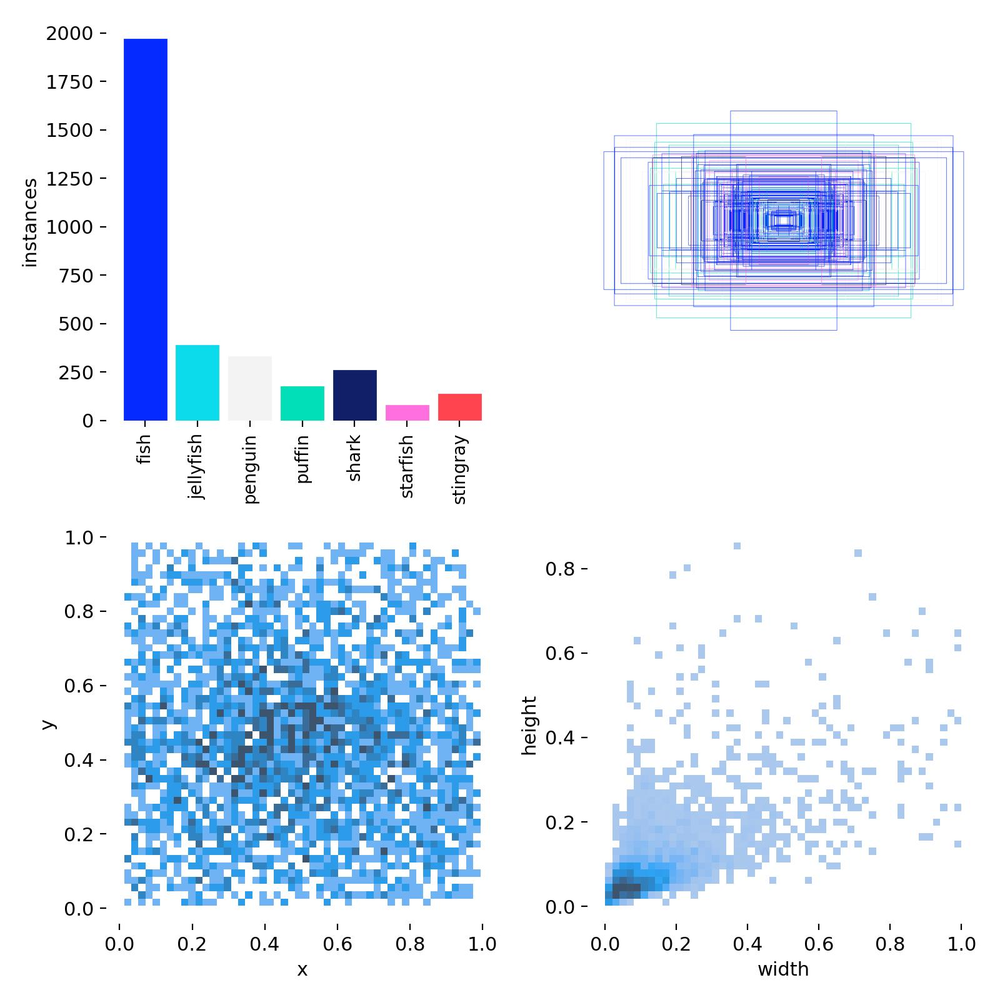

In [ ]:
Image("/content/runs/detect/train/labels.jpg", width=600)

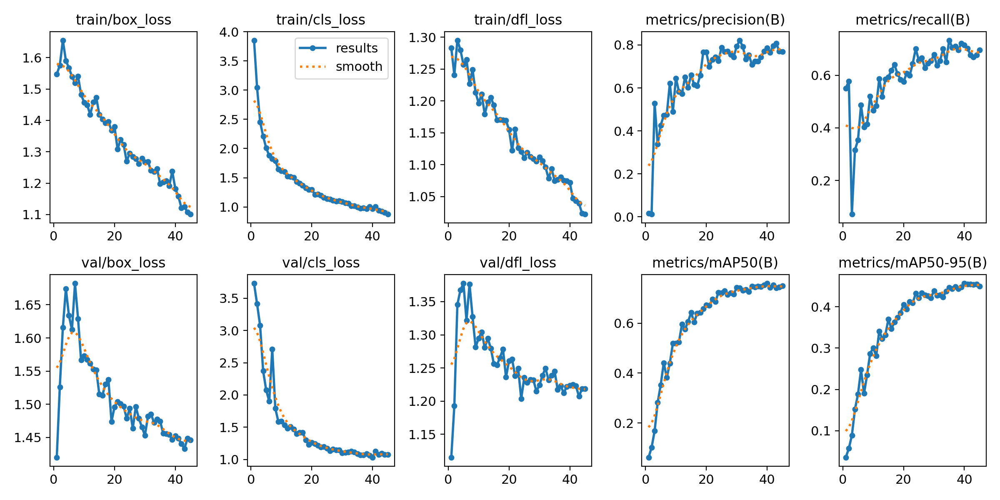

In [ ]:
Image("/content/runs/detect/train/results.png", width=600)

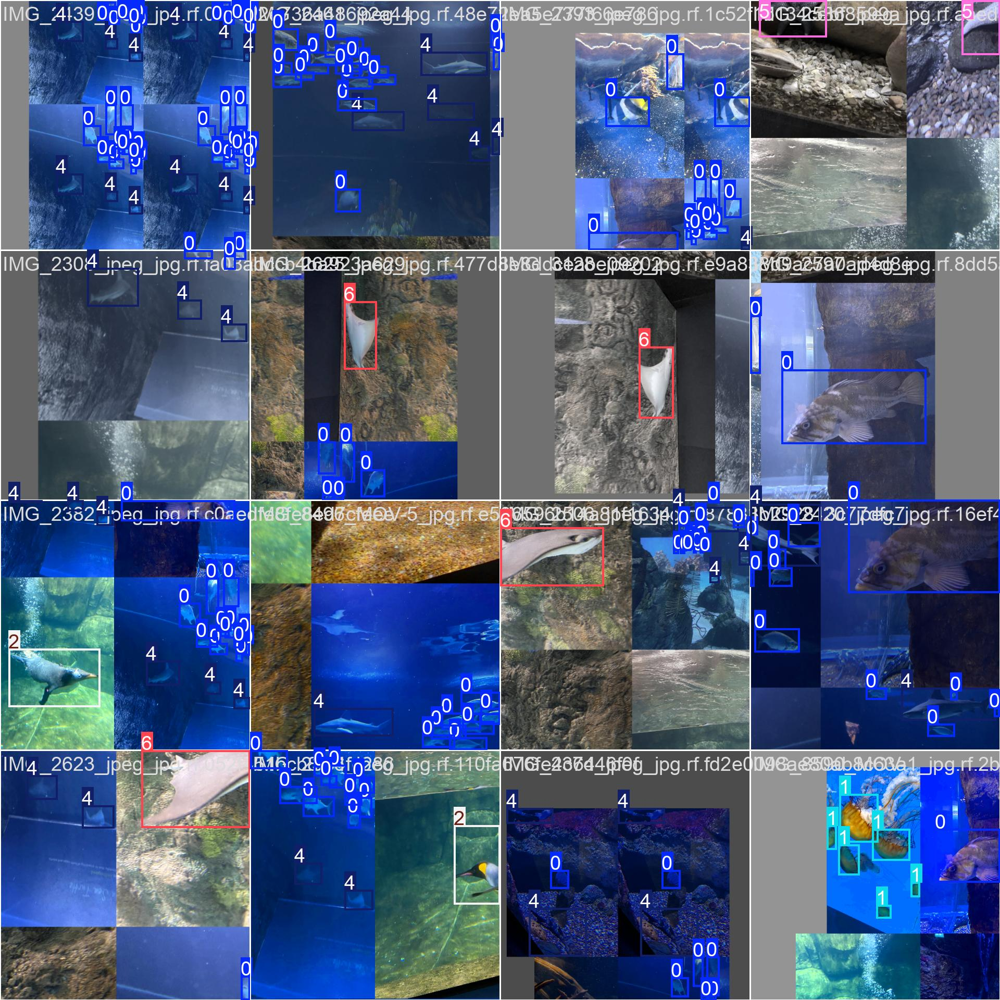

In [ ]:
Image("/content/runs/detect/train/train_batch0.jpg", width=600)

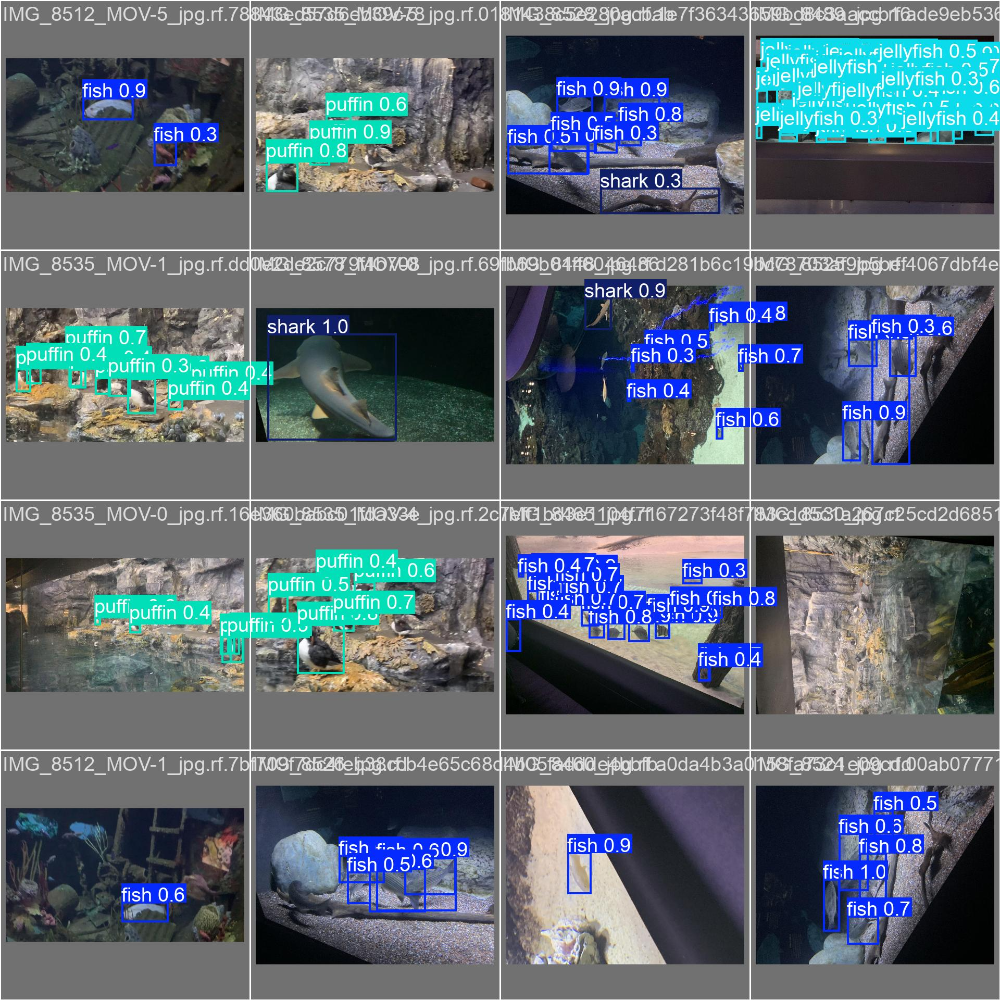

In [ ]:
Image("/content/runs/detect/train/val_batch0_pred.jpg", width=600)

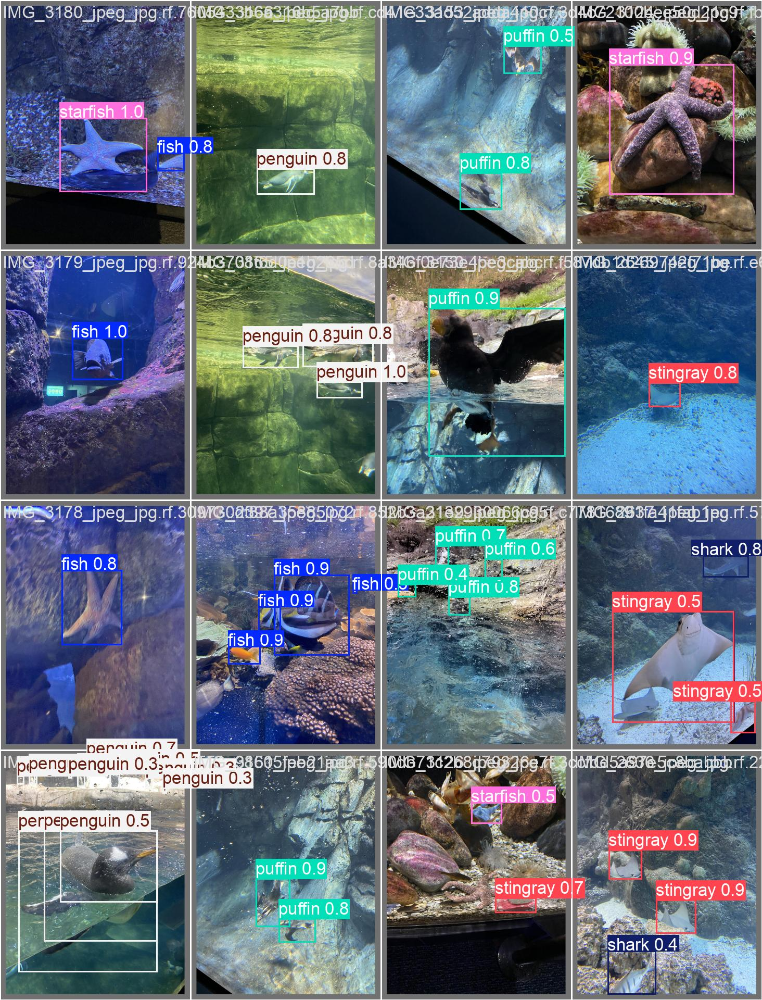

In [ ]:
Image("/content/runs/detect/train/val_batch1_pred.jpg", width=600)

### Validation Fine-Tuned Model

In [ ]:
!yolo task=detect mode=val model="/content/runs/detect/train/weights/best.pt" data={dataset.location}/data.yaml

Ultralytics 8.3.47 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs
val: Scanning /content/Aquarium-Combined-6/valid/labels.cache... 127 images, 0 backgrounds, 0 corrupt: 100% 127/127 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 8/8 [00:04<00:00,  1.61it/s]
                   all        127        909      0.804      0.711      0.761      0.458
                  fish         63        459      0.831      0.754      0.814      0.466
             jellyfish          9        155      0.841      0.871      0.903       0.49
               penguin         17        104      0.693       0.74      0.739      0.331
                puffin         15         74      0.698      0.432      0.518      0.249
                 shark         28         57      0.824      0.667      0.739      0.527
              starfish         17         27

### Inference with Custom Model on Images

In [ ]:
!yolo task=detect mode=predict model="/content/runs/detect/train/weights/best.pt" conf=0.25 source={dataset.location}/test/images save=True

Ultralytics 8.3.47 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs

image 1/63 /content/Aquarium-Combined-6/test/images/IMG_2289_jpeg_jpg.rf.a56bc9be7aed57907c19762cb39801a5.jpg: 640x480 1 puffin, 46.5ms
image 2/63 /content/Aquarium-Combined-6/test/images/IMG_2301_jpeg_jpg.rf.37fbc1665199a72a403b536b0c254df5.jpg: 640x480 22 penguins, 8.8ms
image 3/63 /content/Aquarium-Combined-6/test/images/IMG_2319_jpeg_jpg.rf.be51387731b93b6a7779220ee93ea2f3.jpg: 640x480 11 penguins, 8.6ms
image 4/63 /content/Aquarium-Combined-6/test/images/IMG_2347_jpeg_jpg.rf.2b7a6276ea2120825799cf526ffb1599.jpg: 640x480 1 penguin, 8.4ms
image 5/63 /content/Aquarium-Combined-6/test/images/IMG_2354_jpeg_jpg.rf.cb2166f87ec7c94292497027fec04166.jpg: 640x480 4 penguins, 9.4ms
image 6/63 /content/Aquarium-Combined-6/test/images/IMG_2371_jpeg_jpg.rf.526896a64609c451f462424f1bb04a5d.jpg: 640x480 3 fishs, 9.5ms
image 7/63 /con

Inference with custom model

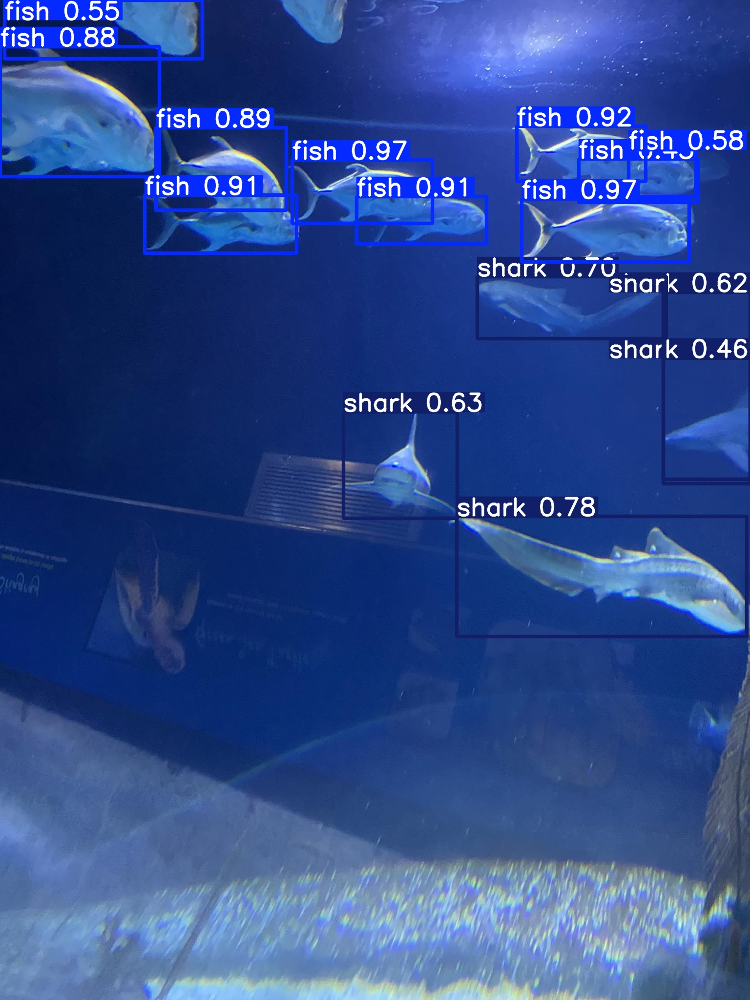

/n


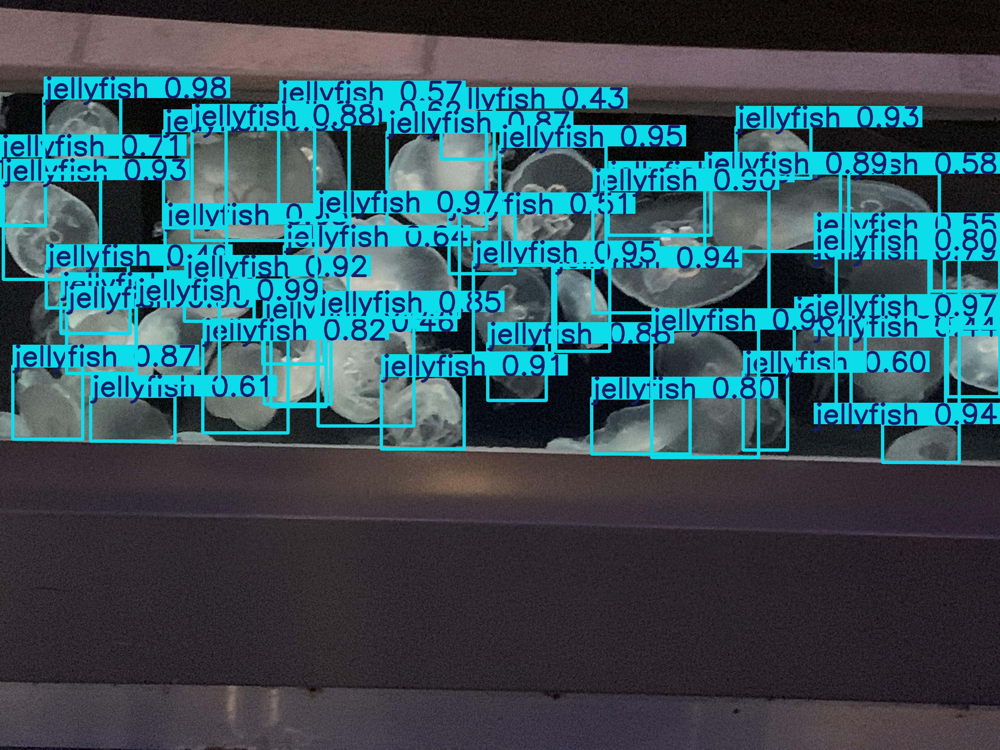

/n


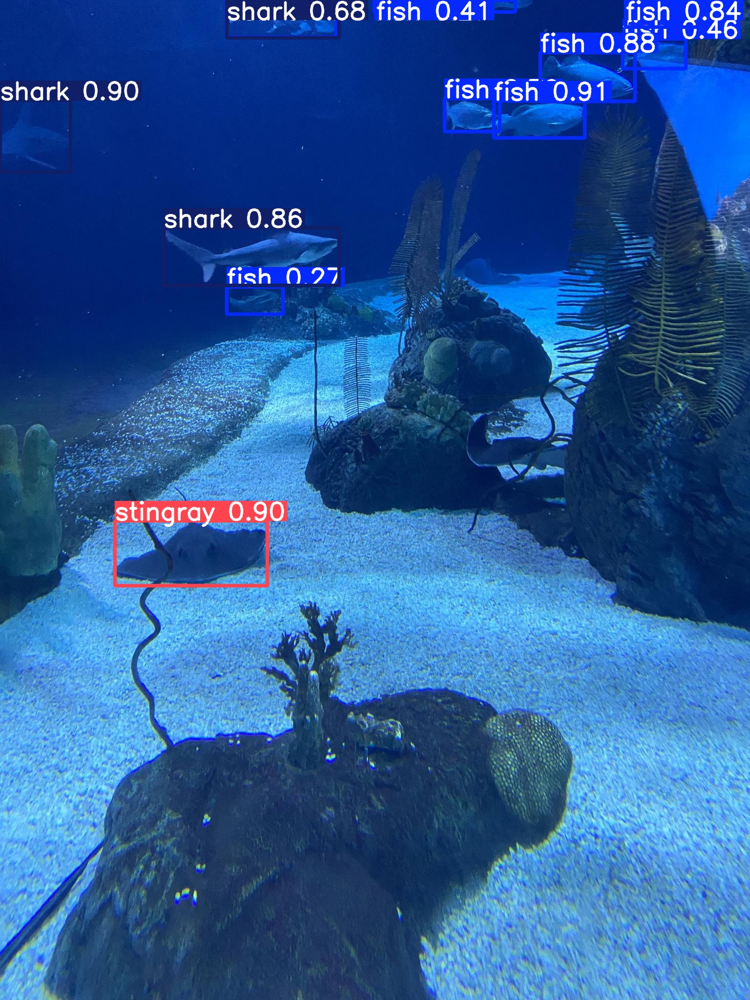

/n


In [ ]:
import glob
import os
from IPython.display import Image as IPyImage, display

latest_folder=max(glob.glob('/content/runs/detect/predict*/'), key=os.path.getmtime)
for img in glob.glob(f'{latest_folder}/*.jpg')[1:4]:
  display(IPyImage(filename=img, width=600))
  print("/n")


Test on different images

In [ ]:
!gdown "https://st3.depositphotos.com/1813545/15272/i/600/depositphotos_152728018-stock-photo-great-white-sharks.jpg"

Downloading...
From: https://st3.depositphotos.com/1813545/15272/i/600/depositphotos_152728018-stock-photo-great-white-sharks.jpg
To: /content/depositphotos_152728018-stock-photo-great-white-sharks.jpg
100% 18.9k/18.9k [00:00<00:00, 60.8MB/s]


In [ ]:
!yolo task=detect mode=predict model= "/content/runs/detect/train/weights/best.pt" conf=0.25 source=image4.jpg save=True

Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs

image 1/1 /content/image4.jpg: 448x640 3 sharks, 46.0ms
Speed: 5.2ms preprocess, 46.0ms inference, 965.9ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict7
💡 Learn more at https://docs.ultralytics.com/modes/predict


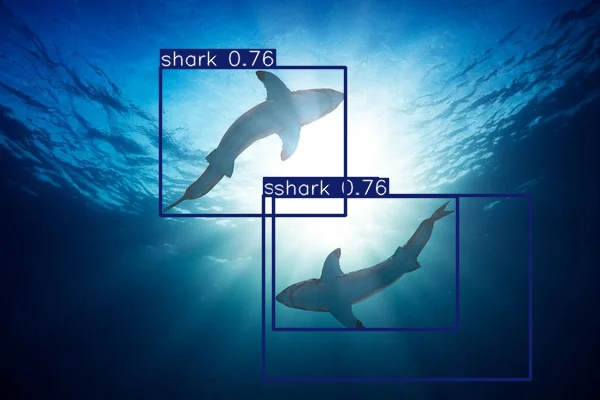

In [ ]:
Image("/content/runs/detect/predict7/image4.jpg", width=600)

In [ ]:
!gdown "https://st3.depositphotos.com/33855454/37152/i/600/depositphotos_371520756-stock-photo-beautiful-salt-aquarium-fish-swimming.jpg"

Downloading...
From: https://st3.depositphotos.com/33855454/37152/i/600/depositphotos_371520756-stock-photo-beautiful-salt-aquarium-fish-swimming.jpg
To: /content/depositphotos_371520756-stock-photo-beautiful-salt-aquarium-fish-swimming.jpg
100% 34.7k/34.7k [00:00<00:00, 24.4MB/s]


In [ ]:
!yolo task=detect mode=predict model= "/content/runs/detect/train/weights/best.pt" conf=0.25 source=image5.jpg save=True

Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs

image 1/1 /content/image5.jpg: 512x640 1 fish, 45.0ms
Speed: 4.8ms preprocess, 45.0ms inference, 577.3ms postprocess per image at shape (1, 3, 512, 640)
Results saved to runs/detect/predict8
💡 Learn more at https://docs.ultralytics.com/modes/predict


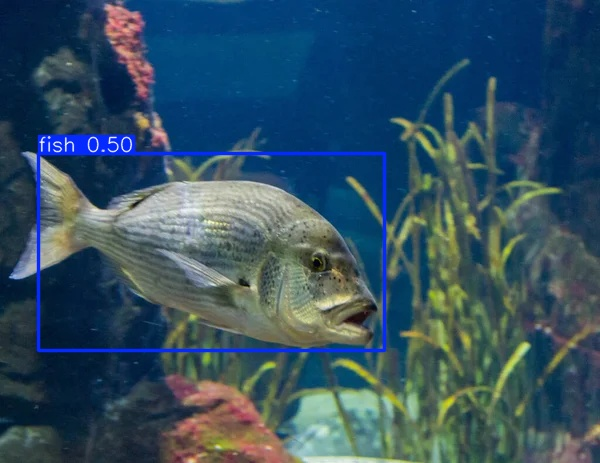

In [ ]:
Image("/content/runs/detect/predict8/image5.jpg", width=600)

In [ ]:
!gdown "https://static6.depositphotos.com/1035122/644/i/600/depositphotos_6446817-stock-photo-chrysaora-fuscescens-jellyfish.jpg"

Downloading...
From: https://static6.depositphotos.com/1035122/644/i/600/depositphotos_6446817-stock-photo-chrysaora-fuscescens-jellyfish.jpg
To: /content/depositphotos_6446817-stock-photo-chrysaora-fuscescens-jellyfish.jpg
100% 30.7k/30.7k [00:00<00:00, 20.9MB/s]


In [ ]:
!yolo task=detect mode=predict model= "/content/runs/detect/train/weights/best.pt" conf=0.25 source=image6.jpg save=True

Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs

image 1/1 /content/image6.jpg: 448x640 5 jellyfishs, 46.3ms
Speed: 4.4ms preprocess, 46.3ms inference, 769.8ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict9
💡 Learn more at https://docs.ultralytics.com/modes/predict


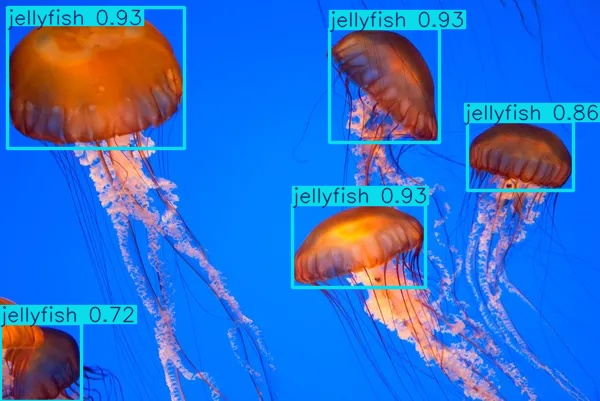

In [ ]:
Image("/content/runs/detect/predict9/image6.jpg", width=600)

In [ ]:
!gdown "https://st4.depositphotos.com/11866110/38098/i/600/depositphotos_380984568-stock-photo-close-image-rock-hopper-penguins.jpg"

Downloading...
From: https://st3.depositphotos.com/3007466/35135/i/600/depositphotos_351352692-stock-photo-humboldt-penguin-spheniscus-humboldti-swimming.jpg
To: /content/depositphotos_351352692-stock-photo-humboldt-penguin-spheniscus-humboldti-swimming.jpg
100% 36.9k/36.9k [00:00<00:00, 84.1MB/s]


In [ ]:
!yolo task=detect mode=predict model= "/content/runs/detect/train/weights/best.pt" conf=0.25 source=image8.jpg save=True

Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs

image 1/1 /content/image8.jpg: 448x640 1 penguin, 63.5ms
Speed: 5.2ms preprocess, 63.5ms inference, 606.0ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict11
💡 Learn more at https://docs.ultralytics.com/modes/predict


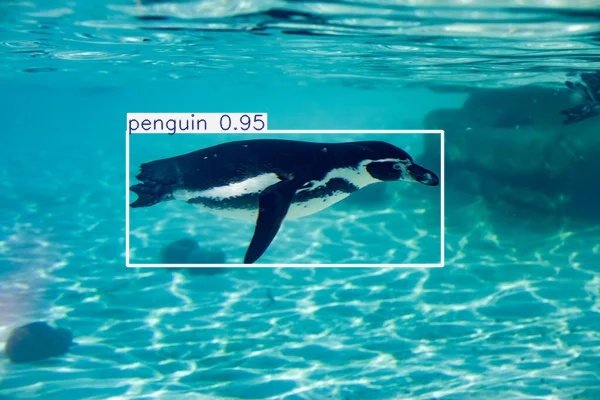

In [ ]:
Image("/content/runs/detect/predict11/image8.jpg", width=600)

In [ ]:
!gdown "https://st4.depositphotos.com/5625700/27488/i/600/depositphotos_274883912-stock-photo-red-starfish-on-the-sea.jpg"

Downloading...
From: https://st4.depositphotos.com/5625700/27488/i/600/depositphotos_274883912-stock-photo-red-starfish-on-the-sea.jpg
To: /content/depositphotos_274883912-stock-photo-red-starfish-on-the-sea.jpg
100% 90.8k/90.8k [00:00<00:00, 4.08MB/s]


In [ ]:
!yolo task=detect mode=predict model= "/content/runs/detect/train/weights/best.pt" conf=0.25 source=image17.jpg save=True

Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs

image 1/1 /content/image17.jpg: 448x640 1 starfish, 44.4ms
Speed: 4.4ms preprocess, 44.4ms inference, 600.3ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict21
💡 Learn more at https://docs.ultralytics.com/modes/predict


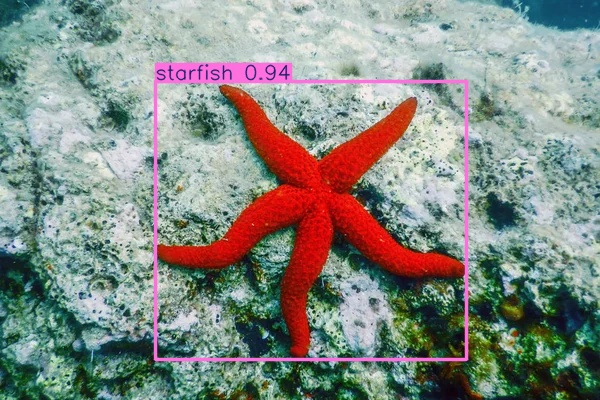

In [ ]:
Image("/content/runs/detect/predict21/image17.jpg", width=600)

In [ ]:
!yolo val model="/content/runs/detect/train/weights/best.pt" data={dataset.location}/data.yaml

Ultralytics 8.3.27 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs
val: Scanning /content/Aquarium-Combined-6/valid/labels.cache... 127 images, 0 backgrounds, 0 corrupt: 100% 127/127 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 8/8 [00:05<00:00,  1.43it/s]
                   all        127        909      0.805      0.691      0.761      0.456
                  fish         63        459      0.846      0.731      0.814      0.466
             jellyfish          9        155      0.835      0.858       0.89      0.483
               penguin         17        104      0.691      0.702      0.749      0.332
                puffin         15         74      0.709      0.429       0.52       0.25
                 shark         28         57      0.848      0.649      0.738      0.525
              starfish         17         27

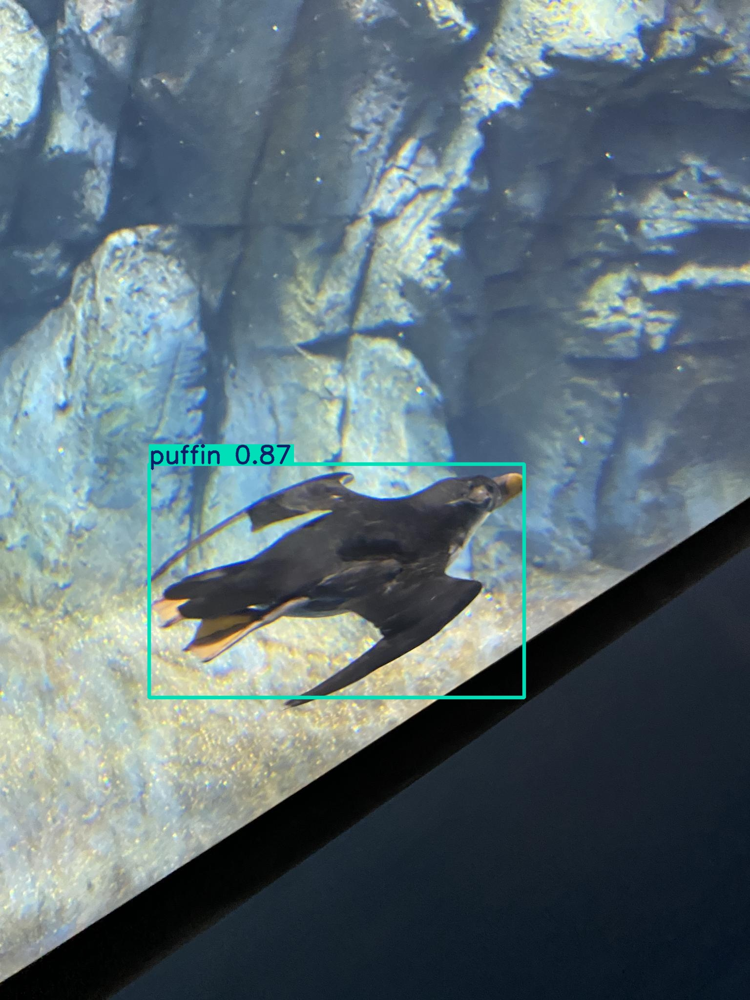

In [ ]:
Image("/content/runs/detect/predict/IMG_2289_jpeg_jpg.rf.a56bc9be7aed57907c19762cb39801a5.jpg", width=600)